In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data=pd.read_csv('./DATA/retail_data.csv')

In [3]:
data.head()

,Transaction_ID,Customer_ID,Name,Email,Phone,Address,City,State,Zipcode,Country,...,Total_Amount,Product_Category,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products
0,8691788.0,37249.0,Michelle Harrington,Ebony39@gmail.com,1.414787e+09,3959 Amanda Burgs,Dortmund,Berlin,77985.0,Germany,...,324.086270,Clothing,Nike,Shorts,Excellent,Same-Day,Debit Card,Shipped,5.0,Cycling shorts
1,2174773.0,69749.0,Kelsey Hill,Mark36@gmail.com,6.852900e+09,82072 Dawn Centers,Nottingham,England,99071.0,UK,...,806.707815,Electronics,Samsung,Tablet,Excellent,Standard,Credit Card,Processing,4.0,Lenovo Tab
2,6679610.0,30192.0,Scott Jensen,Shane85@gmail.com,8.362160e+09,4133 Young Canyon,Geelong,New South Wales,75929.0,Australia,...,1063.432799,Books,Penguin Books,Children's,Average,Same-Day,Credit Card,Processing,2.0,Sports equipment
3,7232460.0,62101.0,Joseph Miller,Mary34@gmail.com,2.776752e+09,8148 Thomas Creek Suite 100,Edmonton,Ontario,88420.0,Canada,...,2466.854021,Home Decor,Home Depot,Tools,Excellent,Standard,PayPal,Processing,4.0,Utility knife
4,4983775.0,27901.0,Debra Coleman,Charles30@gmail.com,9.098268e+09,5813 Lori Ports Suite 269,Bristol,England,48704.0,UK,...,248.553049,Grocery,Nestle,Chocolate,Bad,Standard,Cash,Shipped,1.0,Chocolate cookies


In [4]:
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 302010 entries, 0 to 302009
Data columns (total 30 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Transaction_ID    301677 non-null  float64
 1   Customer_ID       301702 non-null  float64
 2   Name              301628 non-null  object 
 3   Email             301663 non-null  object 
 4   Phone             301648 non-null  float64
 5   Address           301695 non-null  object 
 6   City              301762 non-null  object 
 7   State             301729 non-null  object 
 8   Zipcode           301670 non-null  float64
 9   Country           301739 non-null  object 
 10  Age               301837 non-null  float64
 11  Gender            301693 non-null  object 
 12  Income            301720 non-null  object 
 13  Customer_Segment  301795 non-null  object 
 14  Date              301651 non-null  object 
 15  Year              301660 non-null  float64
 16  Month             30

In [5]:
data.describe()

,Transaction_ID,Customer_ID,Phone,Zipcode,Age,Year,Total_Purchases,Amount,Total_Amount,Ratings
count,3.016770e+05,301702.000000,3.016480e+05,301670.000000,301837.000000,301660.000000,301649.000000,301653.000000,301660.000000,301826.000000
mean,5.495823e+06,55006.553934,5.501464e+09,50298.951019,35.481326,2023.165113,5.359729,255.163659,1367.651156,3.162670
std,2.595565e+06,26005.675200,2.596017e+09,28972.807134,15.021933,0.371283,2.868575,141.389640,1128.998515,1.320827
min,1.000007e+06,10000.000000,1.000049e+09,501.000000,18.000000,2023.000000,1.000000,10.000219,10.003750,1.000000
25%,3.247930e+06,32469.250000,3.255061e+09,25425.000000,22.000000,2023.000000,3.000000,132.890764,438.724278,2.000000
50%,5.499657e+06,55012.000000,5.505812e+09,50602.500000,32.000000,2023.000000,5.000000,255.470969,1041.117547,3.000000
75%,7.739509e+06,77511.000000,7.749860e+09,75252.000000,46.000000,2023.000000,8.000000,377.672606,2029.999853,4.000000
max,9.999995e+06,99999.000000,9.999996e+09,99949.000000,70.000000,2024.000000,10.000000,499.997911,4999.625796,5.000000


In [6]:
data['Date'] = pd.to_datetime(data['Date'])

In [7]:
reference_date = data['Date'].max()
reference_date

Timestamp('2024-02-29 00:00:00')

In [8]:
data.fillna({
    'Total_Purchases': data['Total_Purchases'].median(),
    'Amount': data['Amount'].median(),
    'Total_Amount': data['Total_Amount'].median()
}, inplace=True)

In [9]:
data.dropna(subset=['Customer_ID', 'Transaction_ID'], inplace=True)

In [10]:
rfm = data.groupby('Customer_ID').agg({
    'Date': lambda x: (reference_date - x.max()).days,  # Recency
    'Transaction_ID': 'count',  # Frequency
    'Total_Amount': 'sum'  # Monetary Value
})

In [11]:
rfm.head()

,Date,Transaction_ID,Total_Amount
Customer_ID,,,
10000.0,102.0,4,5007.566357
10001.0,104.0,5,8136.462824
10002.0,94.0,5,4104.013951
10003.0,227.0,2,2340.496447
10004.0,30.0,2,2356.516683


In [12]:
rfm.columns = ['Recency', 'Frequency', 'Monetary']
rfm

,Recency,Frequency,Monetary
Customer_ID,,,
10000.0,102.0,4,5007.566357
10001.0,104.0,5,8136.462824
10002.0,94.0,5,4104.013951
10003.0,227.0,2,2340.496447
10004.0,30.0,2,2356.516683
...,...,...,...
99995.0,97.0,8,9909.700258
99996.0,63.0,4,5414.433873
99997.0,51.0,4,6092.733546


In [13]:
print("NaNs in RFM DataFrame before scaling:")
print(rfm.isna().sum())


NaNs in RFM DataFrame before scaling:
Recency      13
Frequency     0
Monetary      0
dtype: int64


In [14]:
rfm.fillna(rfm.median(), inplace=True)
print("NaNs in RFM DataFrame after handling:")
print(rfm.isna().sum())

NaNs in RFM DataFrame after handling:
Recency      0
Frequency    0
Monetary     0
dtype: int64


In [15]:
scaler = StandardScaler()
rfm_scaled = scaler.fit_transform(rfm)
rfm_scaled

array([[ 0.07093795,  0.29881235,  0.08043765],
       [ 0.0948647 ,  0.86676074,  1.05722814],
       [-0.02476905,  0.86676074, -0.20163669],
       ...,
       [-0.53919421,  0.29881235,  0.41920916],
       [-1.10147288,  0.86676074,  0.65556483],
       [ 0.66910674, -0.83708442,  0.24811842]])

In [16]:
inertia = []
K = range(1, 11)

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(rfm_scaled)
    inertia.append(kmeans.inertia_)

C:\Users\Atharva\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Atharva\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Atharva\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Atharva\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the 

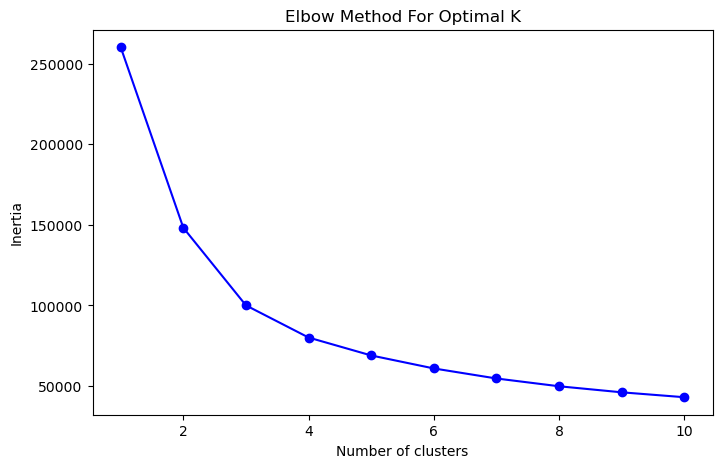

In [17]:
plt.figure(figsize=(8, 5))
plt.plot(K, inertia, 'bo-')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal K')
plt.show()


In [18]:
kmeans = KMeans(n_clusters=4, random_state=42)
rfm['Cluster'] = kmeans.fit_predict(rfm_scaled)

C:\Users\Atharva\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


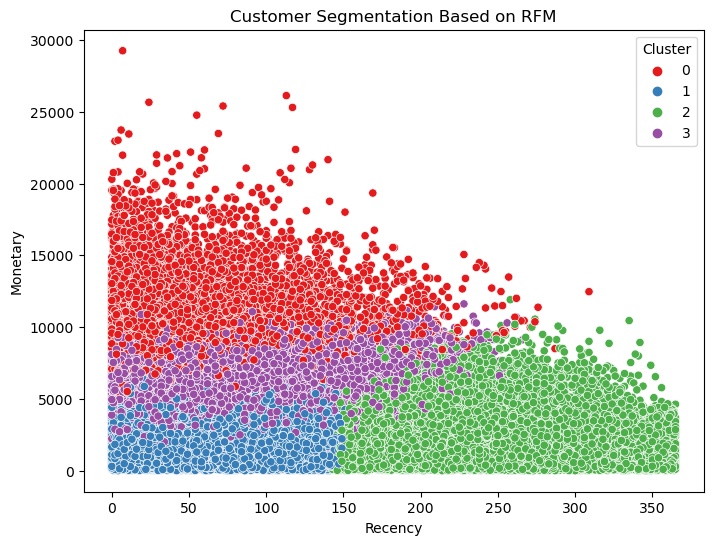

In [19]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Recency', y='Monetary', hue='Cluster', data=rfm, palette='Set1')
plt.title('Customer Segmentation Based on RFM')
plt.show()

In [20]:
print("Cluster Centers:")
print(pd.DataFrame(kmeans.cluster_centers_, columns=['Recency', 'Frequency', 'Monetary']))

Cluster Centers:
    Recency  Frequency  Monetary
0 -0.565946   1.603307  1.702650
1 -0.361814  -0.648373 -0.698709
2  1.613982  -0.866893 -0.694574
3 -0.382750   0.422224  0.325283


In [21]:
# Retrieve and display cluster centers
cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=['Recency', 'Frequency', 'Monetary'])
print("Cluster Centers:")
print(cluster_centers)

# Print interpretation for each cluster
for i, row in cluster_centers.iterrows():
    print(f"\nCluster {i}:")
    print(f"  Recency: {row['Recency']} days since last purchase")
    print(f"  Frequency: {row['Frequency']} transactions")
    print(f"  Monetary: ${row['Monetary']} total spent")

Cluster Centers:
    Recency  Frequency  Monetary
0 -0.565946   1.603307  1.702650
1 -0.361814  -0.648373 -0.698709
2  1.613982  -0.866893 -0.694574
3 -0.382750   0.422224  0.325283

Cluster 0:
  Recency: -0.5659457590885799 days since last purchase
  Frequency: 1.603307413208096 transactions
  Monetary: $1.702649602458913 total spent

Cluster 1:
  Recency: -0.36181447819826745 days since last purchase
  Frequency: -0.6483734706183828 transactions
  Monetary: $-0.6987091258168424 total spent

Cluster 2:
  Recency: 1.6139822501458099 days since last purchase
  Frequency: -0.8668926979814806 transactions
  Monetary: $-0.6945744940858345 total spent

Cluster 3:
  Recency: -0.382750315740168 days since last purchase
  Frequency: 0.4222240529257227 transactions
  Monetary: $0.3252834735861498 total spent


In [22]:
def assign_cluster_name(cluster_id):
    if cluster_id == 0:
        return "Moderate Spenders"
    elif cluster_id == 1:
        return "Infrequent Low Spenders"
    elif cluster_id == 2:
        return "Frequent High Spenders"
    elif cluster_id == 3:
        return "Rare Low Spenders"

In [23]:
rfm['Cluster_Name'] = rfm['Cluster'].apply(assign_cluster_name)


In [24]:
print("RFM DataFrame with Cluster Names:")
print(rfm.head())

RFM DataFrame with Cluster Names:
             Recency  Frequency     Monetary  Cluster             Cluster_Name
Customer_ID                                                                   
10000.0        102.0          4  5007.566357        3        Rare Low Spenders
10001.0        104.0          5  8136.462824        3        Rare Low Spenders
10002.0         94.0          5  4104.013951        3        Rare Low Spenders
10003.0        227.0          2  2340.496447        2   Frequent High Spenders
10004.0         30.0          2  2356.516683        1  Infrequent Low Spenders


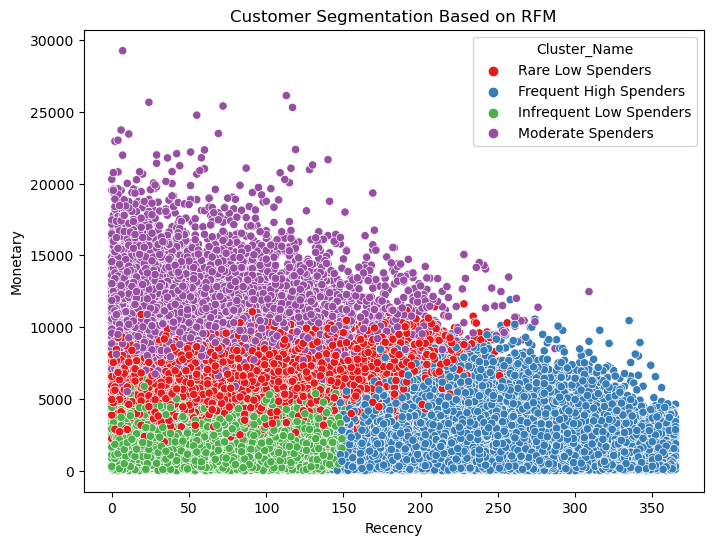

In [25]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Recency', y='Monetary', hue='Cluster_Name', data=rfm, palette='Set1')
plt.title('Customer Segmentation Based on RFM')
plt.show()

In [26]:
import plotly.express as px

In [30]:
data['Date'] = pd.to_datetime(data['Date'], errors='coerce')

# Handle missing values
reference_date = data['Date'].max()
data['Date'].fillna(reference_date, inplace=True)

data.fillna({
    'Total_Purchases': data['Total_Purchases'].median(),
    'Amount': data['Amount'].median(),
    'Total_Amount': data['Total_Amount'].median()
}, inplace=True)

data.dropna(subset=['Customer_ID', 'Transaction_ID'], inplace=True)

# Calculate Recency, Frequency, and Monetary value (RFM) for all customers
rfm = data.groupby('Customer_ID').agg({
    'Date': lambda x: (reference_date - x.max()).days,  # Recency
    'Transaction_ID': 'count',  # Frequency
    'Total_Amount': 'sum'  # Monetary Value
})

# Check the DataFrame structure
print("RFM DataFrame columns and types:")
print(rfm.info())

# Filter for repeated customers (more than one transaction)
repeated_customers = rfm[rfm['Transaction_ID'] > 3].copy()

# Rename columns if necessary (columns might be different based on aggregation)
repeated_customers.columns = ['Recency', 'Frequency', 'Monetary']

# Check for NaNs in repeated_customers and handle them
repeated_customers.fillna(repeated_customers.median(), inplace=True)

# Standardize the RFM values
scaler = StandardScaler()
rfm_scaled = scaler.fit_transform(repeated_customers)

# Apply K-Means Clustering
kmeans = KMeans(n_clusters=4, random_state=42)
repeated_customers['Cluster'] = kmeans.fit_predict(rfm_scaled)

# Define cluster names based on the characteristics of each cluster center
def assign_cluster_name(cluster_id):
    if cluster_id == 0:
        return "Moderate Spenders"
    elif cluster_id == 1:
        return "Infrequent Low Spenders"
    elif cluster_id == 2:
        return "Frequent High Spenders"
    elif cluster_id == 3:
        return "Rare Low Spenders"

# Map cluster IDs to names


RFM DataFrame columns and types:
<class 'pandas.core.frame.DataFrame'>
Index: 86753 entries, 10000.0 to 99999.0
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Date            86753 non-null  int64  
 1   Transaction_ID  86753 non-null  int64  
 2   Total_Amount    86753 non-null  float64
dtypes: float64(1), int64(2)
memory usage: 2.6 MB
None


C:\Users\Atharva\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [31]:
repeated_customers['Cluster_Name'] = repeated_customers['Cluster'].apply(assign_cluster_name)



In [32]:
# Plotly 3D scatter plot for repeated customers
fig = px.scatter_3d(repeated_customers, x='Recency', y='Frequency', z='Monetary',
                    color='Cluster_Name',
                    title='Customer Segmentation for Repeated Customers in 3D',
                    labels={'Recency': 'Recency (Days)', 'Frequency': 'Frequency', 'Monetary': 'Monetary ($)', 'Cluster_Name': 'Cluster'},
                    color_discrete_map={
                        'Moderate Spenders': 'blue',
                        'Infrequent Low Spenders': 'red',
                        'Frequent High Spenders': 'green',
                        'Rare Low Spenders': 'purple'
                    })

# Update marker size and opacity
fig.update_traces(marker=dict(size=5, opacity=0.6, line=dict(width=1, color='DarkSlateGrey')))

# Show the plot
fig.show()

In [33]:
repeated_customers

,Recency,Frequency,Monetary,Cluster,Cluster_Name
Customer_ID,,,,,
10000.0,102,4,5007.566357,1,Infrequent Low Spenders
10001.0,104,5,8136.462824,1,Infrequent Low Spenders
10002.0,94,5,4104.013951,3,Rare Low Spenders
10006.0,15,4,7115.492234,3,Rare Low Spenders
10007.0,33,5,9322.273456,0,Moderate Spenders
...,...,...,...,...,...
99994.0,23,7,11975.133996,2,Frequent High Spenders
99995.0,97,8,9909.700258,2,Frequent High Spenders
99996.0,63,4,5414.433873,3,Rare Low Spenders


In [34]:
repeated_customers_sample = repeated_customers.sample(frac=0.1, random_state=42)  # 20% sample

In [35]:
# Map cluster IDs to names
repeated_customers['Cluster_Name'] = repeated_customers['Cluster'].apply(assign_cluster_name)

# Plotly 3D scatter plot for repeated customers with enhancements
fig = px.scatter_3d(repeated_customers, x='Recency', y='Frequency', z='Monetary',
                    color='Cluster_Name',
                    title='Customer Segmentation for Repeated Customers in 3D',
                    labels={'Recency': 'Recency (Days)', 'Frequency': 'Frequency', 'Monetary': 'Monetary ($)', 'Cluster_Name': 'Cluster'},
                    color_discrete_map={
                        'Moderate Spenders': 'blue',
                        'Infrequent Low Spenders': 'red',
                        'Frequent High Spenders': 'green',
                        'Rare Low Spenders': 'purple'
                    },
                    hover_data={'Recency': True, 'Frequency': True, 'Monetary': True, 'Cluster_Name': True})

# Update marker size, opacity, and add hover information
fig.update_traces(marker=dict(size=3, opacity=1, line=dict(width=1, color='black')))

# Show the plot
fig.show()

In [42]:
sampled_customers = repeated_customers.sample(frac=0.1, random_state=42)

In [43]:
fig = px.scatter_3d(sampled_customers, x='Recency', y='Frequency', z='Monetary',
                    color='Cluster_Name',
                    title='Customer Segmentation for Sampled Repeated Customers in 3D',
                    labels={'Recency': 'Recency (Days)', 'Frequency': 'Frequency', 'Monetary': 'Monetary ($)', 'Cluster_Name': 'Cluster'},
                    color_discrete_map={
                        'Moderate Spenders': 'blue',
                        'Infrequent Low Spenders': 'red',
                        'Frequent High Spenders': 'green',
                        'Rare Low Spenders': 'purple'
                    },
                    hover_data={'Recency': True, 'Frequency': True, 'Monetary': True, 'Cluster_Name': True})

# Update marker size and opacity
fig.update_traces(marker=dict(size=4, opacity=1, line=dict(width=1, color='DarkSlateGrey')))

# Show the plot
fig.show()

C:\Users\Atharva\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning:

The figure layout has changed to tight



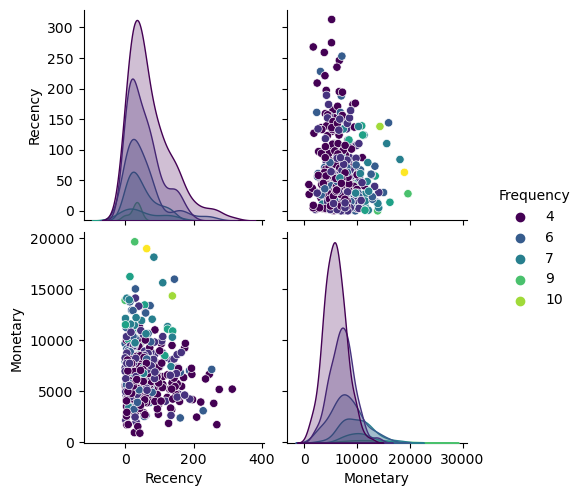

In [38]:
sns.pairplot(sampled_customers[['Recency', 'Frequency', 'Monetary']],hue='Frequency', palette='viridis')
plt.show()